In [6]:
import scanpy as sc
import pandas as pd
import numpy as np
import cellxgene_census
import tiledbsoma as soma

In [3]:
import numpy as np

def distances_to_affinities(distances):
    # convert distances to affinities
    stds = np.std(distances, axis=1)
    stds = (2.0 / stds) ** 2
    stds = stds.reshape(-1, 1)
    distances_tilda = np.exp(-np.true_divide(distances, stds))
    weights = distances_tilda / np.sum(
        distances_tilda, axis=1, keepdims=True
    )
    return weights

In [4]:
#import numba
#@numba.njit
def weighted_prediction(weights, ref_cats, index_reference=-1):
    """Get highest weight category."""
    N = len(weights)
    predictions = np.zeros((N,), dtype=ref_cats.dtype) + index_reference
    uncertainty = np.zeros((N,))
    for i in range(N):
        obs_weights = weights[i]
        obs_cats = ref_cats[i]
        best_prob = 0
        for c in np.unique(obs_cats):
            cand_prob = np.sum(obs_weights[obs_cats == c])
            if cand_prob > best_prob and c!=index_reference:
                best_prob = cand_prob
                predictions[i] = c
                uncertainty[i] = max(1 - best_prob, 0)

    return predictions, uncertainty

In [5]:
local_dir = "/home/cane/Documents/yoseflab/can/scvi-hub"

# Get AnnData

In [5]:
annot = sc.queries.biomart_annotations(
    "hsapiens",
    ["ensembl_gene_id", "gene_biotype"],
    host='asia.ensembl.org'
).set_index("ensembl_gene_id")

In [6]:
annot_sub = annot[annot['gene_biotype']=='protein_coding']

In [7]:
census = cellxgene_census.open_soma(census_version='2023-12-15')

In [8]:
var_metadata = census["census_data"]["homo_sapiens"].ms["RNA"].var.read().concat().to_pandas()
var_metadata.index = var_metadata['feature_id']
var_metadata = var_metadata.loc[np.intersect1d(annot_sub.index, var_metadata.index)]
var_metadata = var_metadata[var_metadata['n_measured_obs'] > 30000000]

In [9]:
from cellxgene_census.experimental.pp import highly_variable_genes

In [10]:
recompute_de_genes = False
import pickle

if recompute_de_genes:
    query = census["census_data"]["homo_sapiens"].axis_query(
        measurement_name="RNA",
        obs_query=soma.AxisQuery(value_filter="is_primary_data == True"),
        var_query=soma.AxisQuery(value_filter="n_measured_obs > 30000000"), # coords=(np.arange(100),)
    )
    hvgs_df = highly_variable_genes(query, n_top_genes=6000, batch_key=["suspension_type", "assay"])

    hv = hvgs_df.highly_variable
    hv.to_pickle("hv_genes.pkl")
else:
    with open("hv_genes.pkl", "rb") as file:
        hv = pickle.load(file)
gene_filter = np.intersect1d(hv[hv].index, var_metadata['soma_joinid'])

In [11]:
var_metadata.index = var_metadata['soma_joinid']
genes = var_metadata.loc[gene_filter]

In [90]:
from scvi.data import cellxgene
adata_url = "https://cellxgene.cziscience.com/e/1b9d8702-5af8-4142-85ed-020eb06ec4f6.cxg/g/"
ref_data = cellxgene(url=adata_url, filename="/external_data/other/scvi-hub/scvi-hub/pan_immune_cells_all.h5ad", census_version='2023-12-15')

In [91]:
ref_data.obs['cell_type'].value_counts()

naive thymus-derived CD4-positive, alpha-beta T cell                          37613
memory B cell                                                                 30124
CD8-positive, alpha-beta memory T cell                                        25519
classical monocyte                                                            21847
CD16-positive, CD56-dim natural killer cell, human                            20591
effector memory CD4-positive, alpha-beta T cell                               19869
alveolar macrophage                                                           17238
CD4-positive helper T cell                                                    16099
T follicular helper cell                                                      15293
effector memory CD8-positive, alpha-beta T cell, terminally differentiated    14612
naive B cell                                                                  13998
CD8-positive, alpha-beta memory T cell, CD45RO-positive                     

In [92]:
ad = sc.read_h5ad('../cart_integrated_annotated.h5ad', backed='r')

In [93]:
ref_data = ref_data[:, np.intersect1d(ad.var_names, ref_data.var_names)].copy()

# Train model

In [94]:
import functools
import scvi

In [95]:
ref_data.obs["batch"] = functools.reduce(lambda a, b: a + b, [ref_data.obs[c].astype(str) for c in ['assay', 'suspension_type', 'donor_id']])

In [96]:
scvi.model.SCVI.setup_anndata(ref_data, batch_key="batch")

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


In [97]:
ref_data

AnnData object with n_obs × n_vars = 329762 × 3988
    obs: 'donor_id', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Majority_voting_CellTypist_high', 'Manually_curated_celltype', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'batch', '_scvi_batch', '_scvi_labels'
    var: 'gene_symbols', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype'
    uns: 'cell_type_ontology_term_id_colors', 'default_embedding', 'schema_version', 'sex_ontology_term_id_colors', 'title', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_umap'

In [98]:
model = scvi.model.SCVI(ref_data, n_layers=2, n_latent=20, gene_likelihood="nb", encode_covariates=True, n_hidden=128)
model.train(
    max_epochs=100,
    batch_size=512,
    train_size=0.90,
    early_stopping=False,
    plan_kwargs={"n_epochs_kl_warmup": 30, 'max_kl_weight': 1}
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/100:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 100/100: 100%|██████████| 100/100 [07:02<00:00,  4.04s/it, v_num=1, train_loss_step=749, train_loss_epoch=745]

`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|██████████| 100/100 [07:02<00:00,  4.23s/it, v_num=1, train_loss_step=749, train_loss_epoch=745]


/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


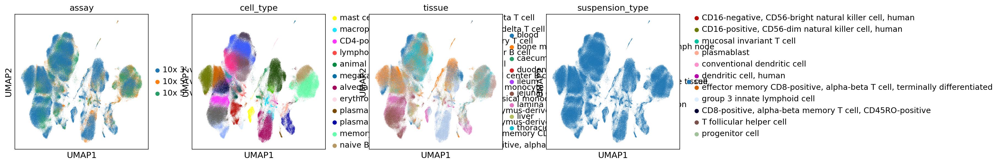

In [99]:
ref_data.obsm['_scvi_latent_qzm'] = model.get_latent_representation()
sc.pp.neighbors(ref_data, method='rapids', use_rep='_scvi_latent_qzm')
sc.tl.umap(ref_data, method='rapids')
sc.pl.umap(ref_data, color=['assay', 'cell_type', 'tissue', 'suspension_type'])

In [100]:
ref_data.obs['cell_type'].value_counts()

naive thymus-derived CD4-positive, alpha-beta T cell                          37613
memory B cell                                                                 30124
CD8-positive, alpha-beta memory T cell                                        25519
classical monocyte                                                            21847
CD16-positive, CD56-dim natural killer cell, human                            20591
effector memory CD4-positive, alpha-beta T cell                               19869
alveolar macrophage                                                           17238
CD4-positive helper T cell                                                    16099
T follicular helper cell                                                      15293
effector memory CD8-positive, alpha-beta T cell, terminally differentiated    14612
naive B cell                                                                  13998
CD8-positive, alpha-beta memory T cell, CD45RO-positive                     

In [101]:
model.save('panimmune_model', save_anndata=True, overwrite=True)

# Downstram

## Train CAR-T cell query

In [7]:
import scvi

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [8]:
model = scvi.model.SCVI.load('panimmune_model')

INFO     File panimmune_model/model.pt already downloaded                                                          


An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


In [9]:
from scvi.data import cellxgene
adata_url = "https://cellxgene.cziscience.com/e/fa3e2a80-1c9a-4097-a02f-bf47e143fca7.cxg/" # fails here
query = cellxgene(adata_url, filename="car_tcell.h5ad", save_path='.', census_version='2023-12-15')

In [10]:
query.X = query.raw.X

In [11]:
pd.options.display.max_columns = None

In [12]:
query.obs['batch'] = query.obs['assay'].astype(str) + '_' + query.obs['suspension_type'].astype(str) + '_' + query.obs['sample_id'].astype(str)

In [13]:
from scvi.model import SCVI
SCVI.prepare_query_anndata(query, model)

INFO     Found 89.14242728184554% reference vars in query data.                                                    


/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/anndata/_core/merge.py:1337: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


In [109]:
query_model = model.load_query_data(query, reference_model=model)
surgery_epochs = 50
train_kwargs_surgery = {
    "early_stopping": True,
    "early_stopping_monitor": "elbo_train",
    "early_stopping_patience": 10,
    "early_stopping_min_delta": 0.001,
    "plan_kwargs": {"weight_decay": 0.0},
}
query_model.train(
    max_epochs=surgery_epochs,
    accelerator="cuda",
    batch_size=4096,
    **train_kwargs_surgery,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 4/50:   6%|▌         | 3/50 [00:36<09:25, 12.02s/it, v_num=1, train_loss_step=2.23e+3, train_loss_epoch=2.25e+3]

Epoch 50/50: 100%|██████████| 50/50 [10:00<00:00, 12.02s/it, v_num=1, train_loss_step=1.71e+3, train_loss_epoch=1.74e+3]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|██████████| 50/50 [10:00<00:00, 12.01s/it, v_num=1, train_loss_step=1.71e+3, train_loss_epoch=1.74e+3]


In [110]:
query_model.save('cart_query_model_panimmune', save_anndata=True, overwrite=True)

## Check results

In [15]:
query_model = scvi.model.SCVI.load('cart_query_model_panimmune')

INFO     File cart_query_model_panimmune/model.pt already downloaded                                               


2024-11-19 00:17:51.858457: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-19 00:17:51.858583: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-19 00:17:51.880783: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-19 00:17:52.861452: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


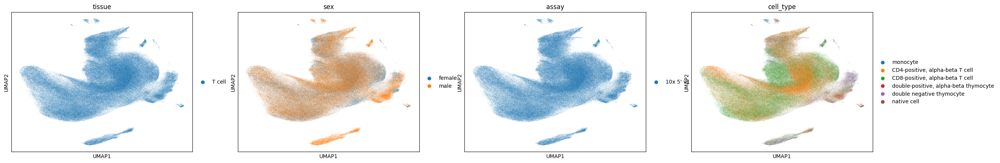

In [16]:
query.obsm['_scvi_latent_qzm'] = query_model.get_latent_representation()
sc.pp.neighbors(query, method='rapids', use_rep='_scvi_latent_qzm', n_neighbors=5)
sc.tl.umap(query, method='rapids', min_dist=0.3)
sc.pl.umap(query, color=['tissue', 'sex', 'assay', 'cell_type'])

In [17]:
combined_data = model.adata.concatenate(query, join='outer')

/tmp/ipykernel_2675920/3545829168.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  combined_data = model.adata.concatenate(query, join='outer')


/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/anndata/_core/merge.py:1337: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


/tmp/ipykernel_2675920/2932169504.py:2: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  combined_data_sub = model.adata.concatenate(query_sub, join='outer')
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/anndata/_core/merge.py:1337: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


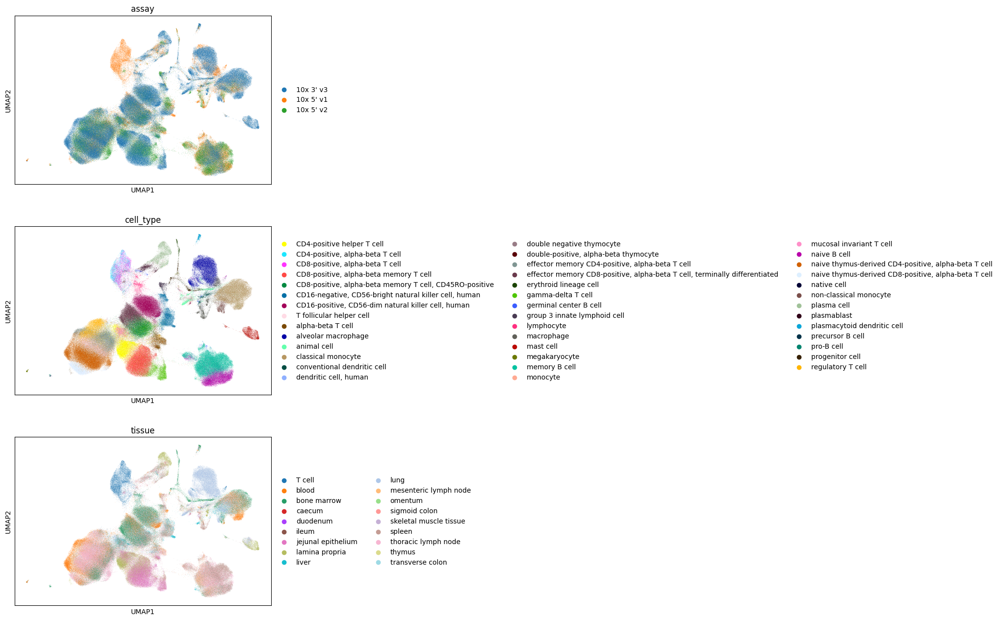

In [18]:
query_sub = sc.pp.subsample(query, n_obs=10000, copy=True)
combined_data_sub = model.adata.concatenate(query_sub, join='outer')
sc.pp.neighbors(combined_data_sub, method='rapids', use_rep='_scvi_latent_qzm')
sc.tl.umap(combined_data_sub, method='rapids')
sc.pl.umap(combined_data_sub, color=['assay', 'cell_type', 'tissue'], ncols=1)

In [19]:
sc.pp.neighbors(combined_data, method='rapids', use_rep='_scvi_latent_qzm')
sc.tl.umap(combined_data, method='rapids')

In [20]:
pd.options.display.max_columns=None

In [21]:
combined_data.obs[['assay', 'tissue']].value_counts()

assay      tissue                
10x 5' v1  T cell                    417167
10x 3' v3  bone marrow                30806
           spleen                     28979
           lung                       27370
           thoracic lymph node        24581
           blood                      21965
10x 5' v1  spleen                     21830
10x 5' v2  spleen                     21153
10x 5' v1  thoracic lymph node        19571
10x 5' v2  thoracic lymph node        18495
10x 3' v3  lamina propria             16942
           jejunal epithelium         16418
10x 5' v2  mesenteric lymph node      14292
           jejunal epithelium         10669
10x 5' v1  mesenteric lymph node       8905
           lung                        7770
10x 5' v2  lamina propria              6745
           liver                       6700
10x 5' v1  liver                       6668
           bone marrow                 5326
           blood                       4771
10x 5' v2  bone marrow                 437

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


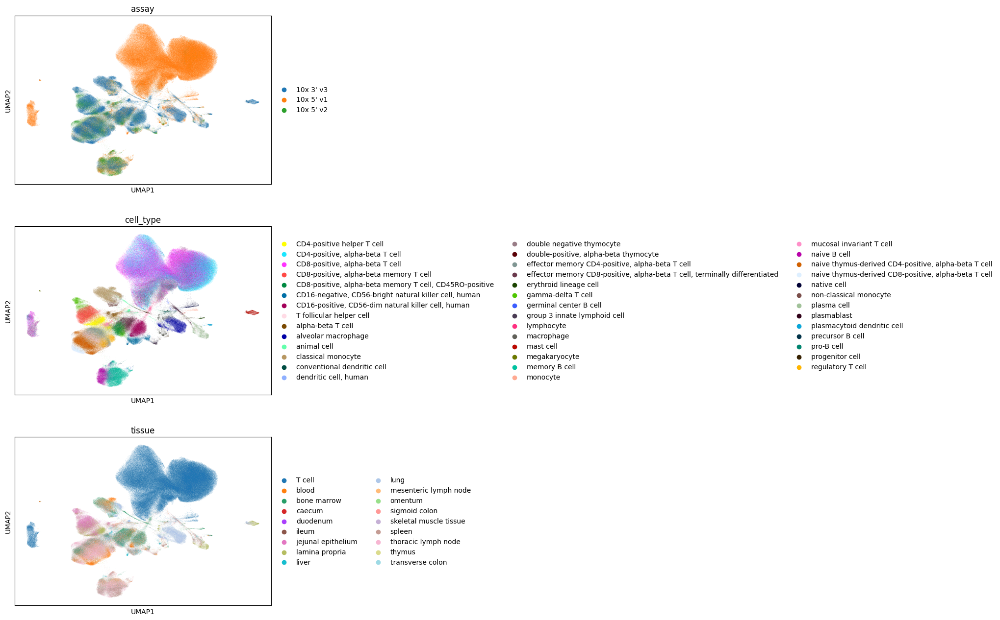

In [22]:
sc.pl.umap(combined_data, color=['assay', 'cell_type', 'tissue'], ncols=1)

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


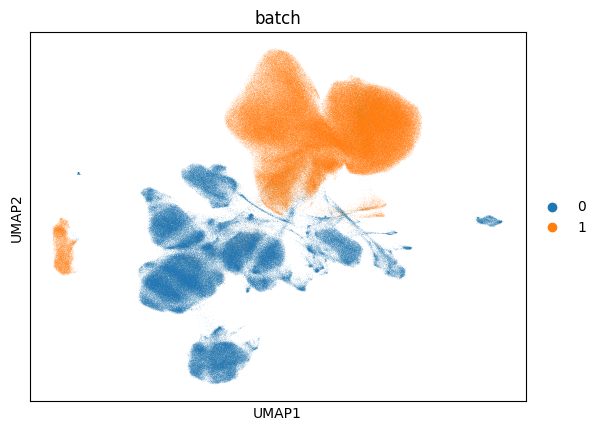

In [23]:
sc.pl.umap(combined_data, color=['batch'], ncols=1)

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


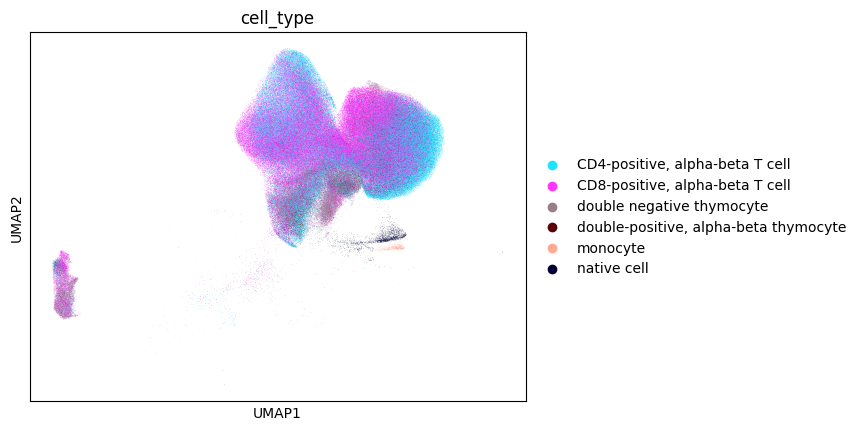

In [24]:
sc.pl.umap(combined_data[combined_data.obs['batch']=='1'], color=['cell_type'], ncols=1)

In [25]:
query.layers['normalized_counts'] = query.X.copy()
sc.pp.normalize_total(query, layer='normalized_counts')
sc.pp.log1p(query, layer='normalized_counts')

In [26]:
combined_data.write_h5ad('cart_query_panimmune.h5ad')

## Shared indices coarse overview of integration

In [27]:
import pynndescent

combined_nn_index = pynndescent.NNDescent(combined_data.obsm['_scvi_latent_qzm'])
combined_nn_index.prepare()

In [28]:
import pickle

pickle.dump(combined_nn_index, open('pynndesecent_index_cart.pkl', 'wb'))

In [29]:
import pickle
combined_nn_index = pickle.load(open('pynndesecent_index_cart.pkl', 'rb'))
ref_neighbors, ref_distances = combined_nn_index.query(model.adata.obsm['_scvi_latent_qzm'])
weights = distances_to_affinities(ref_distances)

In [30]:
combined_data.obs['cell_type_query'] = [i[1]['cell_type'] if i[1]['batch']=='1' else 'reference' for i in combined_data.obs.iterrows()]
combined_data.obs['cell_type_query'].value_counts()

reference                                329762
CD8-positive, alpha-beta T cell          185226
CD4-positive, alpha-beta T cell          164114
double negative thymocyte                 33747
double-positive, alpha-beta thymocyte     30472
native cell                                2936
monocyte                                    672
Name: cell_type_query, dtype: int64

In [31]:
combined_data.obs['cell_type_reference'] = [i[1]['cell_type'] if i[1]['batch']=='0' else 'query' for i in combined_data.obs.iterrows()]
combined_data.obs['cell_type_reference'].value_counts()

query                                                                         417167
naive thymus-derived CD4-positive, alpha-beta T cell                           37613
memory B cell                                                                  30124
CD8-positive, alpha-beta memory T cell                                         25519
classical monocyte                                                             21847
CD16-positive, CD56-dim natural killer cell, human                             20591
effector memory CD4-positive, alpha-beta T cell                                19869
alveolar macrophage                                                            17238
CD4-positive helper T cell                                                     16099
T follicular helper cell                                                       15293
effector memory CD8-positive, alpha-beta T cell, terminally differentiated     14612
naive B cell                                                     

In [32]:
combined_data.obs['cell_type'].value_counts()

CD8-positive, alpha-beta T cell                                               185226
CD4-positive, alpha-beta T cell                                               164114
naive thymus-derived CD4-positive, alpha-beta T cell                           37613
double negative thymocyte                                                      33747
double-positive, alpha-beta thymocyte                                          30472
memory B cell                                                                  30124
CD8-positive, alpha-beta memory T cell                                         25519
classical monocyte                                                             21847
CD16-positive, CD56-dim natural killer cell, human                             20591
effector memory CD4-positive, alpha-beta T cell                                19869
alveolar macrophage                                                            17238
CD4-positive helper T cell                                       

In [33]:
label_key = "cell_type"
combined_data.obs[label_key] = combined_data.obs[label_key].astype("category")
ref_cats = combined_data.obs[label_key].cat.codes.to_numpy()[ref_neighbors]
p, u = weighted_prediction(weights, ref_cats)
p = np.asarray(combined_data.obs[label_key].cat.categories)[p]

In [34]:
model.adata.obs["cell_type_pred"], model.adata.obs["cell_type_uncertainty"] = p, u

In [35]:
label_key = "cell_type_query"
combined_data.obs[label_key] = combined_data.obs[label_key].astype("category")
ref_cats = combined_data.obs[label_key].cat.codes.to_numpy()[ref_neighbors]
p, u = weighted_prediction(weights, ref_cats, index_reference = np.where(combined_data.obs[label_key].cat.categories=='reference')[0])
p = np.asarray(combined_data.obs[label_key].cat.categories)[p]
model.adata.obs["cell_type_pred_query"], model.adata.obs["cell_type_uncertainty_query"] = p, u

In [36]:
np.mean(model.adata.obs["cell_type_uncertainty_query"]==0)

0.9757127867977511

In [37]:
import matplotlib.pyplot as plt

In [64]:
sc.set_figure_params(vector_friendly=True, dpi_save=300, fontsize=14)
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['axes.grid'] = False
plt.rcParams['axes.unicode_minus'] = True
model.adata.obs['cell_type_uncertainty_query_none'] = [i if i else None for i in model.adata.obs['cell_type_uncertainty_query']]

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


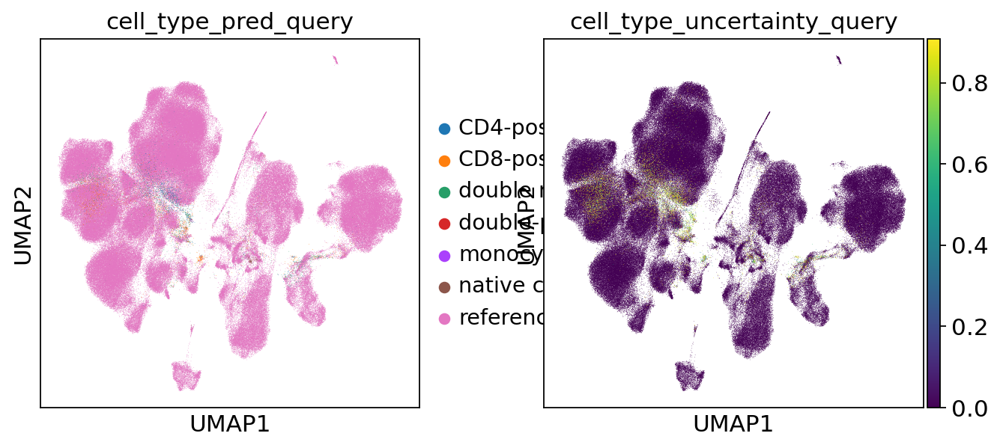

In [39]:
model.adata.obs['cell_type_pred_query'] = model.adata.obs['cell_type_pred_query'][model.adata.obs_names]
model.adata.obs['cell_type_uncertainty_query'] = model.adata.obs['cell_type_uncertainty_query'][model.adata.obs_names]
sc.pp.neighbors(model.adata, method='rapids', use_rep='_scvi_latent_qzm')
sc.tl.umap(model.adata, method='rapids')
sc.pl.umap(model.adata, color=['cell_type_pred_query', 'cell_type_uncertainty_query'])

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


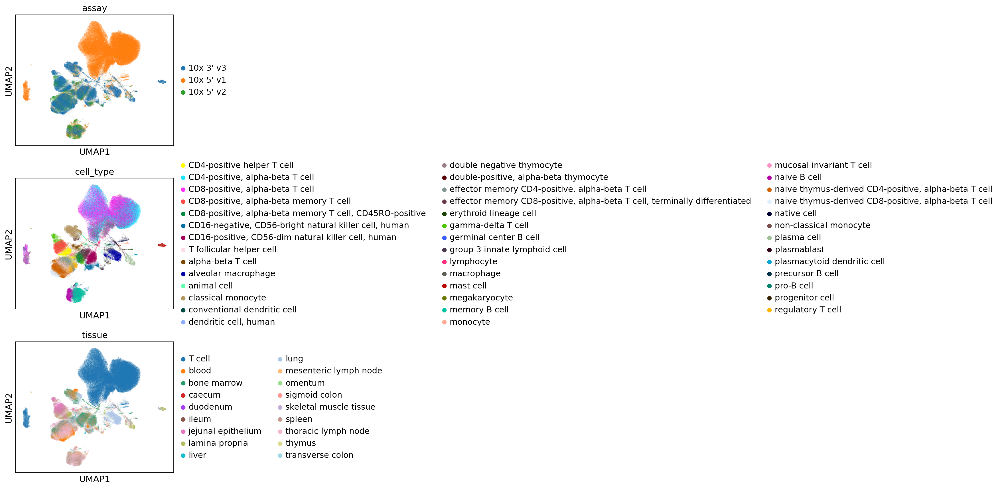

In [40]:
sc.pl.umap(combined_data, color=['assay', 'cell_type', 'tissue'], ncols=1, save='panimmune_cart_combined.svg')

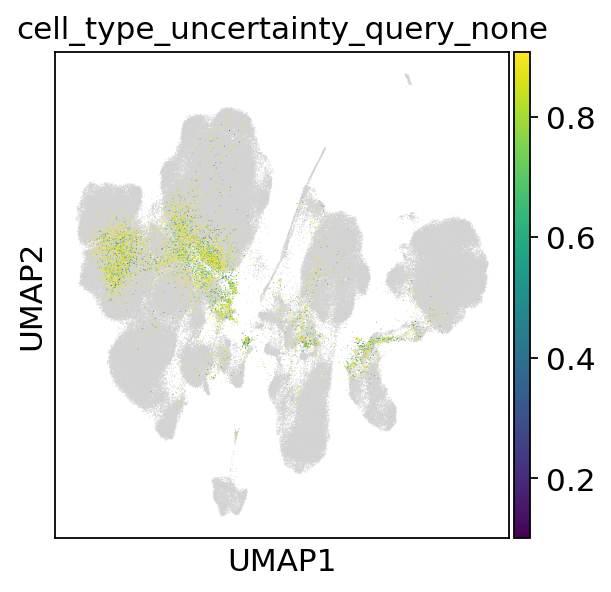

In [41]:
sc.pl.umap(model.adata, color=['cell_type_uncertainty_query_none'], size=0.7, save='query_neighbors_with_cart.svg')

## Celltypist to CART

In [42]:
reference_data = model.adata

In [43]:
reference_nn_index = pynndescent.NNDescent(reference_data.obsm['_scvi_latent_qzm'])
reference_nn_index.prepare()
pickle.dump(reference_nn_index, open('pynndesecent_index_celltypist.pkl', 'wb'))

In [44]:
import pickle
reference_nn_index = pickle.load(open('pynndesecent_index_celltypist.pkl', 'rb'))
query_neighbors, query_distances = reference_nn_index.query(query.obsm['_scvi_latent_qzm'])
weights = distances_to_affinities(query_distances)

In [45]:
label_key = "cell_type"
ref_cats = reference_data.obs[label_key].cat.codes.to_numpy()[query_neighbors]
p, u = weighted_prediction(weights, ref_cats)
p = np.asarray(reference_data.obs[label_key].cat.categories)[p]
query.obs["celltypist_cell_type_pred"], query.obs["celltypist_cell_type_uncertainty"] = p, u

In [46]:
label_key = "cell_type"
ref_cats = reference_data.obs[label_key].cat.codes.to_numpy()[query_neighbors]
p, u = weighted_prediction(weights, ref_cats, index_reference = np.where(reference_data.obs[label_key].cat.categories=='lymphocyte')[0])
p = np.asarray(reference_data.obs[label_key].cat.categories)[p]
query.obs["celltypist_cell_type_pred_wo_lymphocyte"], query.obs["celltypist_cell_type_uncertainty_wo_lymphocyte"] = p, u

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


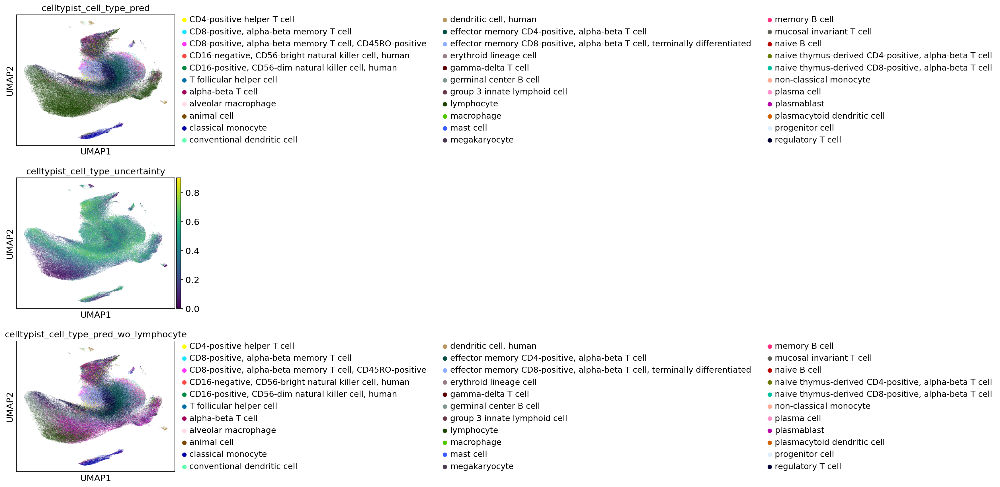

In [47]:
sc.pl.umap(query, color=["celltypist_cell_type_pred", "celltypist_cell_type_uncertainty", "celltypist_cell_type_pred_wo_lymphocyte"], ncols=1)

In [48]:
reference_data.obs['celltypist_cell_type_pred'] = reference_data.obs['cell_type']
combined_celltypist = reference_data.concatenate(query, join='outer', batch_key='data_source')

/tmp/ipykernel_2675920/1261881453.py:2: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  combined_celltypist = reference_data.concatenate(query, join='outer', batch_key='data_source')


/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/anndata/_core/merge.py:1337: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


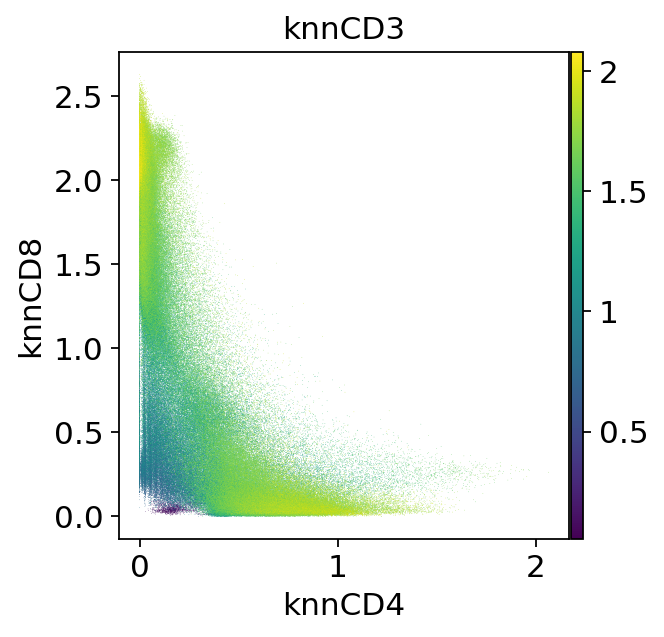

In [49]:
sc.pl.scatter(query, x='knnCD4', y='knnCD8', color='knnCD3')

In [50]:
query.obsm['_scvi_latent_qzm'] = query_model.get_latent_representation()
sc.pp.neighbors(query, method='rapids', use_rep='_scvi_latent_qzm', n_neighbors=10)

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


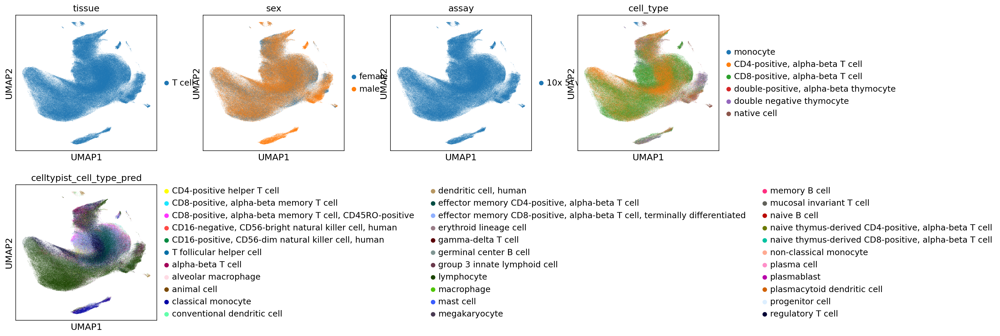

In [51]:
#sc.tl.umap(query, min_dist=0.3)
sc.pl.umap(query, color=['tissue', 'sex', 'assay', 'cell_type', 'celltypist_cell_type_pred'], save='panimmune_cart.svg')

In [52]:
2

2

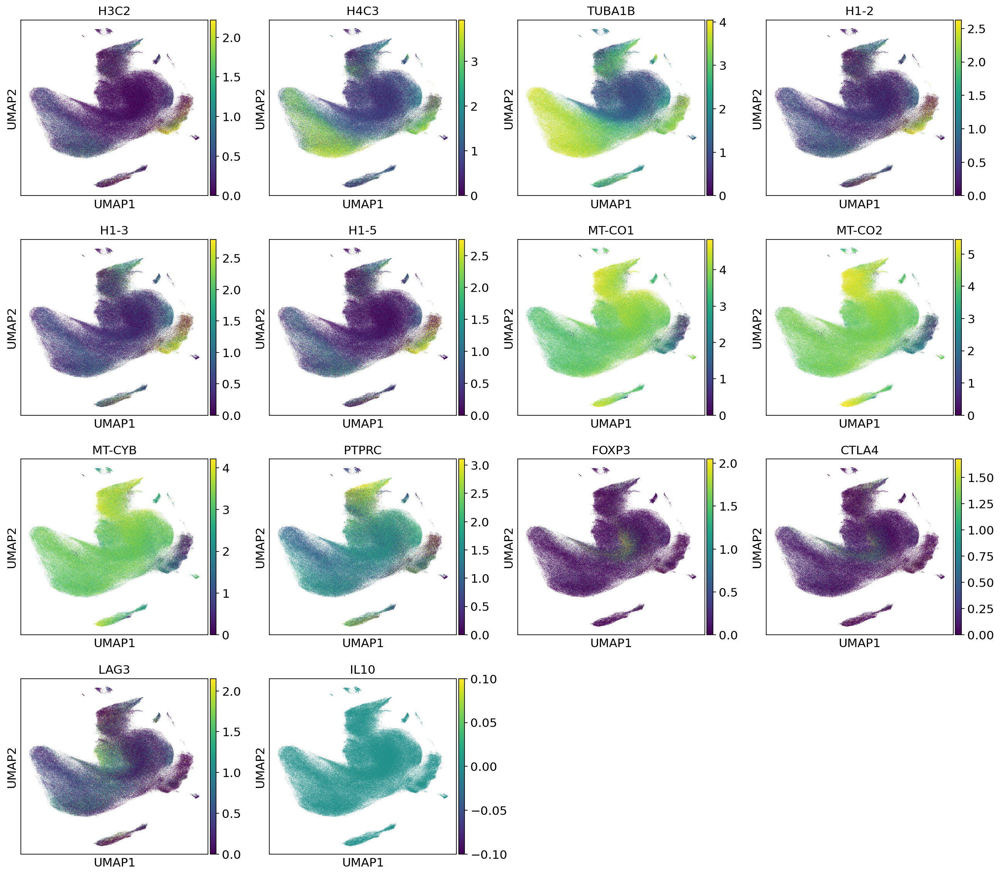

In [53]:
sc.pl.umap(query,
           color=['H3C2', 'H4C3', 'TUBA1B', 'H1-2', 'H1-3', 'H1-5', 'MT-CO1', 'MT-CO2', 'MT-CYB', 'PTPRC', 'FOXP3', 'CTLA4', 'LAG3', 'IL10'],
           gene_symbols='feature_name', layer='normalized_counts', vmax='p98', sort_order=False, )

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


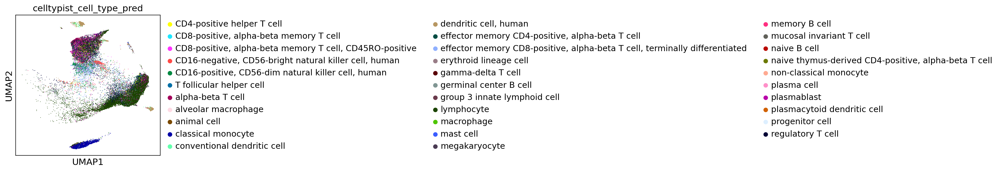

In [54]:
sc.pl.umap(query[query.obs['knnCD3']<1.0], color='celltypist_cell_type_pred')

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


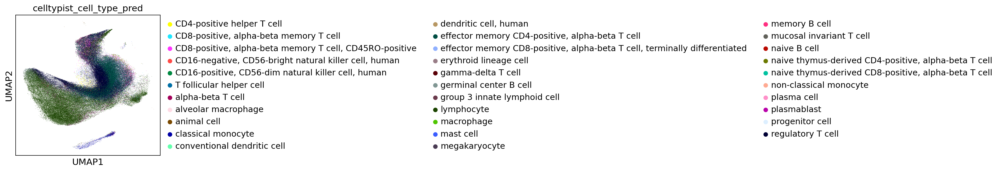

In [55]:
sc.pl.umap(query[np.logical_and(query.obs['knnCD4']>0.3, query.obs['knnCD3']>1.0)], color='celltypist_cell_type_pred')

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


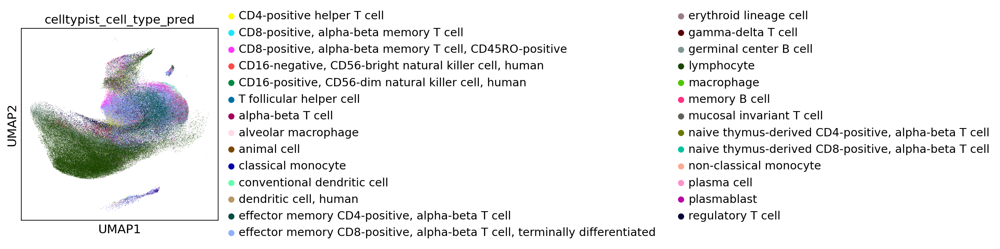

In [56]:
sc.pl.umap(query[np.logical_and(query.obs['knnCD8']>1.0, query.obs['knnCD3']>1.0)], color='celltypist_cell_type_pred')

In [57]:
limit = 200
query.obs['celltypist_cell_type_pred_sub'] = query.obs['celltypist_cell_type_pred'].astype(str).map({x[0]: x[0] if x[1] > limit else 'other' for x in dict(query.obs['celltypist_cell_type_pred'].value_counts()).items()})

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


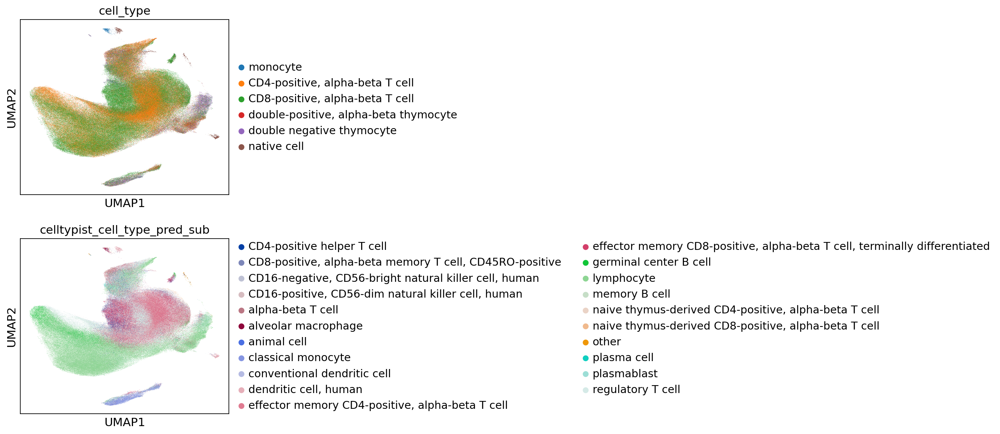

In [58]:
sc.pl.umap(query, color=['cell_type', 'celltypist_cell_type_pred_sub'], save='celltypes_cart_panimmune.svg', ncols=1)

In [59]:
car_tcell_census = sc.read_h5ad('cart_integrated_annotated.h5ad')

In [60]:
query.obs['celltypist_cell_type_pred_old'] = car_tcell_census.obs['celltypist_cell_type_pred_sub']

In [61]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

def _prediction_eval(
    pred,
    labels,
    name,
    x_label="",
    y_label="",
    save_fig=None,
):
    """Generate confusion matrix."""
    types, _ = np.unique(np.concatenate([labels, pred]), return_inverse=True)
    mtx = confusion_matrix(labels, pred, normalize="true")
    df = pd.DataFrame(mtx, columns=types, index=types)
    df = df.loc[np.unique(labels), np.unique(pred)]
    df = df.rename_axis(x_label, axis="columns")
    df = df.rename_axis(y_label)
    #df = df[df.idxmax(axis=1).unique()]
    df = df[pred.value_counts().index]
    positions = [df.columns.get_loc(index) for index in df.idxmax(axis=1)]
    df = df.loc[df.index[np.argsort(positions)]]
    fig, ax = plt.subplots(figsize=[15, 15])
    sns.heatmap(df.T, linewidths=0.005, cmap="OrRd", square=True)
    plt.tight_layout()
    plt.title(name)
    plt.xlabel('PopV prediction')
    plt.ylabel('Original Annotation')

    if save_fig:
        plt.savefig(save_fig)
    plt.show()
    
    return df

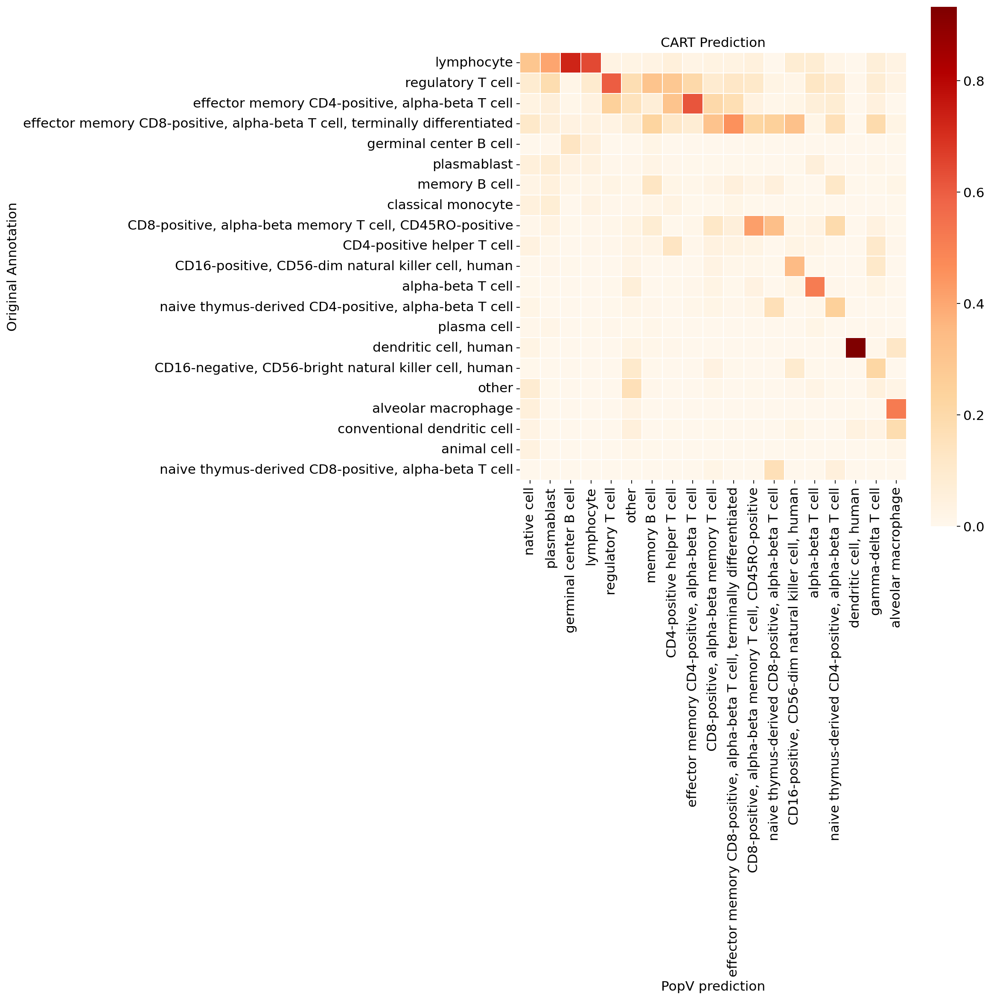

In [65]:
_ = _prediction_eval(
    labels=query.obs['celltypist_cell_type_pred_old'],
    pred=query.obs['celltypist_cell_type_pred_sub'],
    name='CART Prediction',
    x_label=["New label"],
    y_label=["Old label"],
    save_fig=f"figures/cart_celltype_prediction.svg",
)

In [63]:
query.write_h5ad('cart_query_panimmune.h5ad')